In [1]:
!pip install keras tensorflow scikeras numpy==1.22.0

In [3]:
# Load the necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import save_model, load_model
from tensorflow.keras.preprocessing import image as keras_image
from scikeras.wrappers import KerasClassifier

In [4]:
data_dir = '/kaggle/input/plantvillage-dataset/color'

class_folders = os.listdir(data_dir)
image_paths = []
labels = []

for class_folder in class_folders:
    class_path = os.path.join(data_dir, class_folder)
    image_files = os.listdir(class_path)
    for image_file in image_files:
        image_path = os.path.join(class_path, image_file)
        image_paths.append(image_path)
        labels.append(class_folder)

df = pd.DataFrame({'image_path': image_paths, 'label': labels})

In [5]:
df.head()

,image_path,label
0,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
1,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
2,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
3,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
4,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight


In [6]:
df.shape

(54305, 2)

In [7]:
print("The classes:\n", np.unique(df['label']))

The classes:
 ['Apple___Apple_scab' 'Apple___Black_rot' 'Apple___Cedar_apple_rust'
 'Apple___healthy' 'Blueberry___healthy'
 'Cherry_(including_sour)___Powdery_mildew'
 'Cherry_(including_sour)___healthy'
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'
 'Corn_(maize)___Common_rust_' 'Corn_(maize)___Northern_Leaf_Blight'
 'Corn_(maize)___healthy' 'Grape___Black_rot'
 'Grape___Esca_(Black_Measles)'
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)' 'Grape___healthy'
 'Orange___Haunglongbing_(Citrus_greening)' 'Peach___Bacterial_spot'
 'Peach___healthy' 'Pepper,_bell___Bacterial_spot'
 'Pepper,_bell___healthy' 'Potato___Early_blight' 'Potato___Late_blight'
 'Potato___healthy' 'Raspberry___healthy' 'Soybean___healthy'
 'Squash___Powdery_mildew' 'Strawberry___Leaf_scorch'
 'Strawberry___healthy' 'Tomato___Bacterial_spot' 'Tomato___Early_blight'
 'Tomato___Late_blight' 'Tomato___Leaf_Mold' 'Tomato___Septoria_leaf_spot'
 'Tomato___Spider_mites Two-spotted_spider_mite' 'Tomato___Target_Spot'


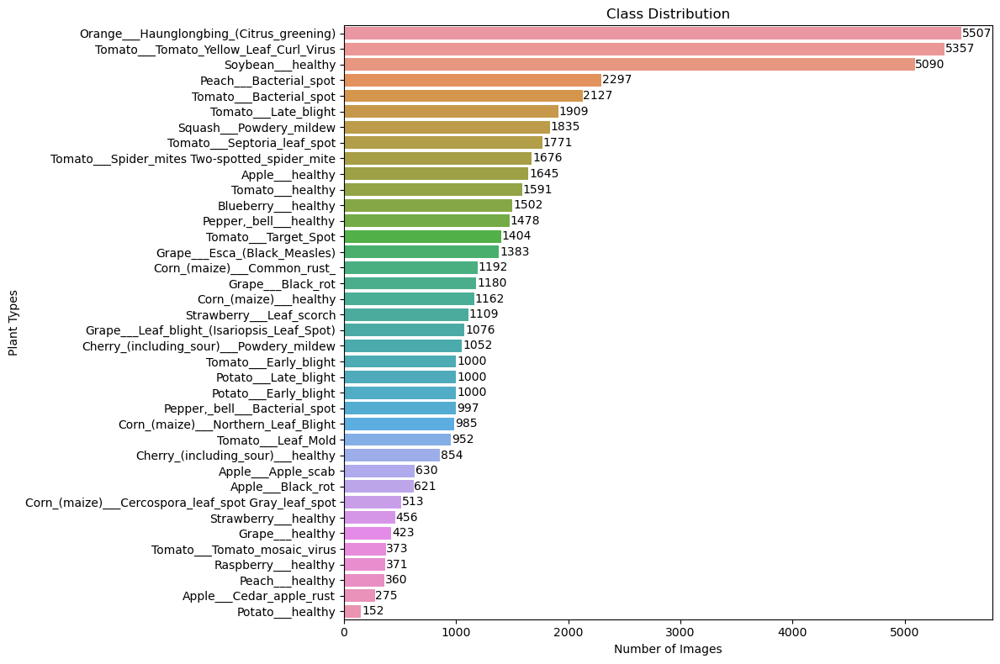

In [8]:
# Count the number of images in each class
class_counts = df['label'].value_counts()

# Visualize class distribution using a horizontal bar plot
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=class_counts.values, y=class_counts.index, orient='h')
plt.title('Class Distribution')
plt.xlabel('Number of Images')
plt.ylabel('Plant Types')
plt.tight_layout()  # Adjust the layout to prevent overlapping labels

# Add data labels to each bar
for i, v in enumerate(class_counts.values):
    ax.text(v + 5, i, str(v), color='black', va='center')

plt.show()

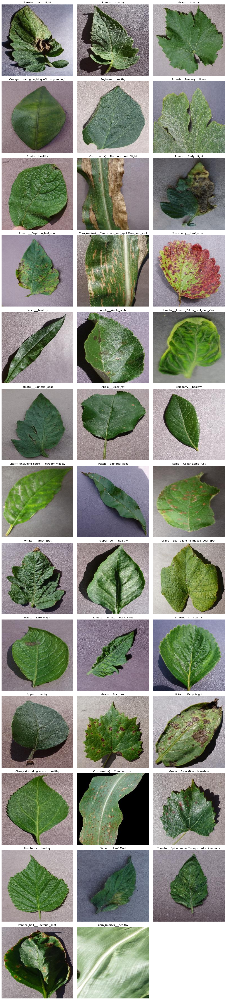

In [9]:
# Display sample images from each class
num_classes = len(df['label'].unique())
num_images_per_row = 3
num_rows = (num_classes + num_images_per_row - 1) // num_images_per_row

plt.figure(figsize=(15, 5 * num_rows))  # Adjust figure size based on the number of rows

for i, plant_class in enumerate(df['label'].unique()):
    plt.subplot(num_rows, num_images_per_row, i + 1)
    
    # Inside the loop for displaying sample images
    image_path = os.path.join(data_dir, df[df['label'] == plant_class]['image_path'].iloc[0])

    # Check if the image exists and can be loaded
    if os.path.exists(image_path):
        sample_image = cv2.imread(image_path)
        if sample_image is not None:
            plt.imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
            plt.title(plant_class)
            plt.axis('off')
        else:
            print(f"Error: Unable to load image from path: {image_path}")
    else:
        print(f"Error: Image path does not exist: {image_path}")

plt.tight_layout()
plt.show()

## Preprocessing Data

In [10]:
class_labels_dict = {class_label: idx for idx, class_label in enumerate(np.unique(df['label']))}
df['label'] = df['label'].map(class_labels_dict)

In [11]:
# Split the data into training and test sets (80% training, 20% test)
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

In [12]:
train_df.shape, test_df.shape

((43444, 2), (10861, 2))

In [13]:
# Split the training data into training and validation sets (80% training, 20% validation)
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42)

In [14]:
train_df.shape, val_df.shape

((34755, 2), (8689, 2))

In [15]:
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)
test_df['label'] = test_df['label'].astype(str)

In [16]:
print(train_df['label'].unique())

['35' '24' '8' '9' '5' '15' '4' '11' '33' '12' '19' '27' '32' '13' '26'
 '1' '16' '3' '21' '14' '28' '30' '6' '34' '29' '25' '31' '20' '0' '10'
 '37' '17' '18' '23' '36' '7' '2' '22']


## Running the Initial Model

In [17]:
batch_size = 40

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)

val_datagen = ImageDataGenerator(rescale=1./255)

val_generator = val_datagen.flow_from_dataframe(
    val_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(
    test_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Step 4: Model Selection
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# num_classes = len(class_folders)
num_classes = len(class_labels_dict)


# Step 5: Model Building
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Step 6: Model Training
learning_rate = 0.001
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

epochs = 10
history = model.fit(train_generator, epochs=epochs, validation_data=val_generator)

Found 34755 validated image filenames belonging to 38 classes.
Found 8689 validated image filenames belonging to 38 classes.
Found 10861 validated image filenames belonging to 38 classes.
Epoch 1/10
869/869 [==============================] - 525s 563ms/step - loss: 0.4307 - accuracy: 0.8734 - val_loss: 20.3224 - val_accuracy: 0.2016
Epoch 2/10
869/869 [==============================] - 495s 570ms/step - loss: 0.1948 - accuracy: 0.9400 - val_loss: 7.0546 - val_accuracy: 0.2932
Epoch 3/10
869/869 [==============================] - 497s 572ms/step - loss: 0.1533 - accuracy: 0.9530 - val_loss: 3.2485 - val_accuracy: 0.5730
Epoch 4/10
869/869 [==============================] - 497s 572ms/step - loss: 0.1370 - accuracy: 0.9577 - val_loss: 2.8092 - val_accuracy: 0.5637
Epoch 5/10
869/869 [==============================] - 502s 577ms/step - loss: 0.1254 - accuracy: 0.9614 - val_loss: 3.9126 - val_accuracy: 0.4696
Epoch 6/10
869/869 [==============================] - 503s 578ms/step - loss: 0.1

In [18]:
# Check the keys available in the model history
print(model.history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


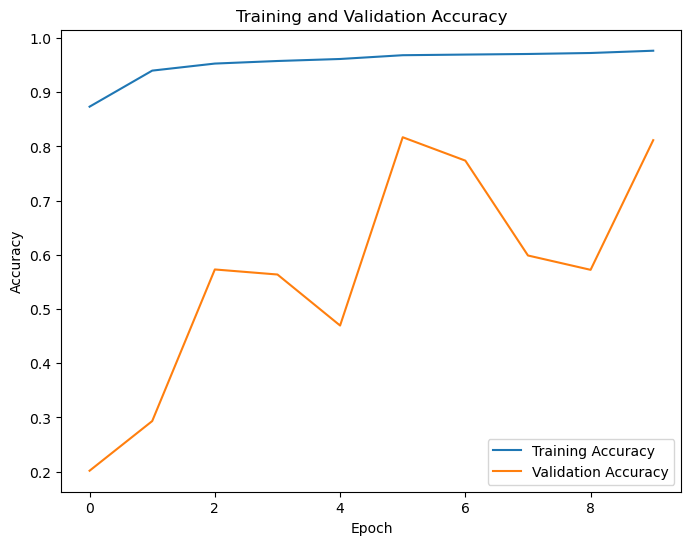

In [19]:
# Visualize training and validation accuracy
plt.figure(figsize=(8, 6))
plt.plot(model.history.history['accuracy'], label='Training Accuracy')  # Use 'accuracy' for TensorFlow 2.x and Keras 2.x
plt.plot(model.history.history['val_accuracy'], label='Validation Accuracy')  # Use 'val_accuracy' for TensorFlow 2.x and Keras 2.x
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

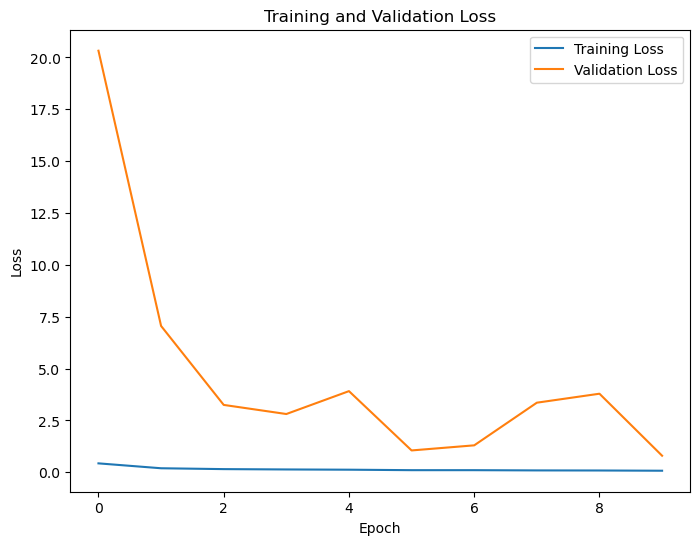

In [20]:
# Visualize training and validation loss
plt.figure(figsize=(8, 6))
plt.plot(model.history.history['loss'], label='Training Loss')
plt.plot(model.history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [21]:
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

272/272 [==============================] - 94s 344ms/step - loss: 0.7796 - accuracy: 0.8199
Test Loss: 0.7795886397361755, Test Accuracy: 0.8199061155319214


## Error Analysis

In [22]:
# Make predictions on the test set
test_predictions = model.predict(test_generator)
test_predicted_labels = np.argmax(test_predictions, axis=1)

# Get the true labels for the test set
test_true_labels = test_generator.classes

# Create a DataFrame for analysis
error_df = pd.DataFrame({'True Label': test_true_labels, 'Predicted Label': test_predicted_labels})

# Misclassified images
misclassified_images = error_df[error_df['True Label'] != error_df['Predicted Label']]

272/272 [==============================] - 29s 103ms/step


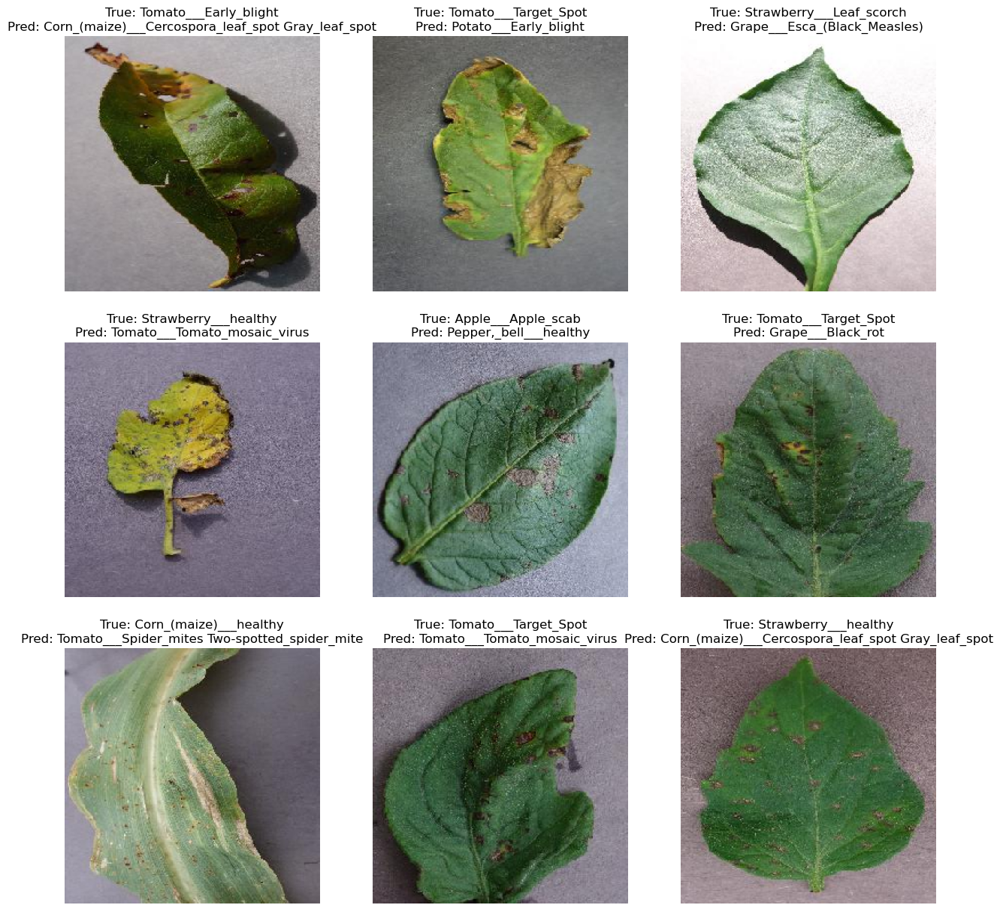

In [23]:
# Visualization of misclassified images
plt.figure(figsize=(15, 15))
for i, row in enumerate(misclassified_images.head(9).itertuples()):
    img_path = test_df.iloc[row.Index]['image_path']
    img = keras_image.load_img(img_path, target_size=(224, 224))
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    true_label = class_folders[row._1]  # Use 'True Label' as defined in error_df
    pred_label = class_folders[row._2]  # Use 'Predicted Label' as defined in error_df
    plt.title(f'True: {true_label}\nPred: {pred_label}')
    plt.axis('off')
plt.show()

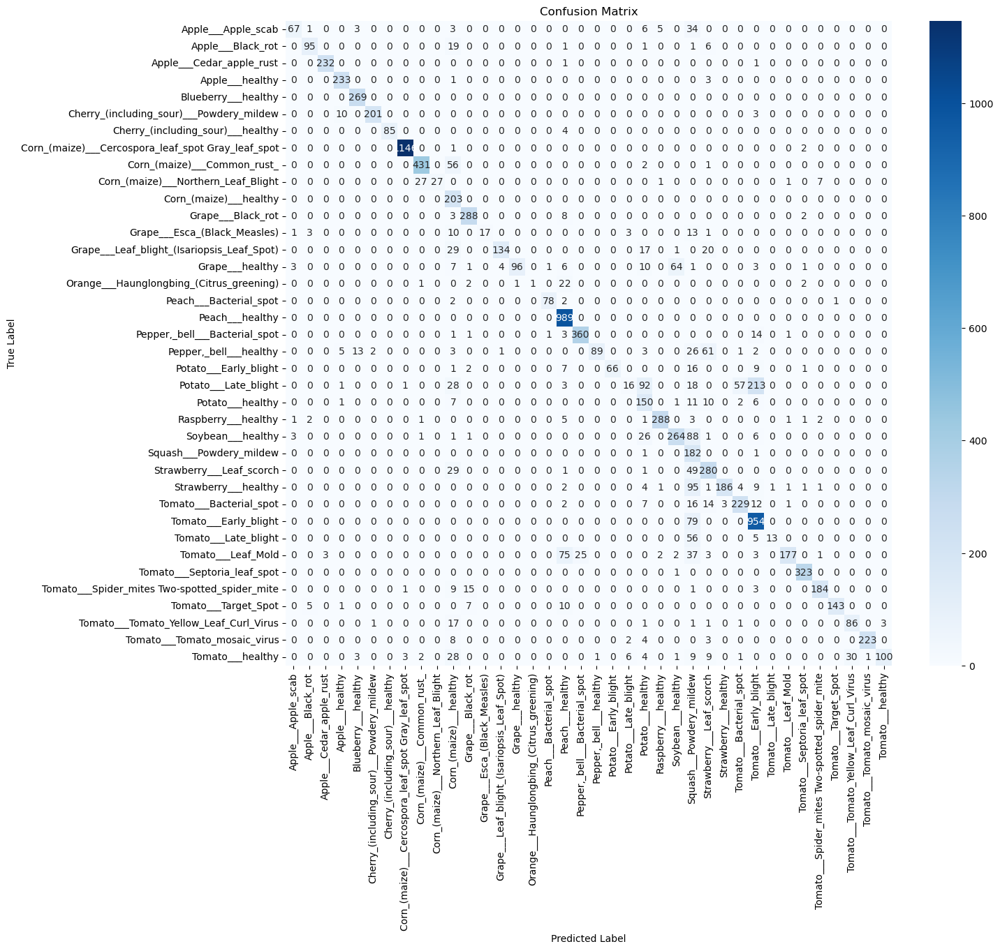

In [24]:
# Confusion Matrix and Classification Report
plt.figure(figsize=(14, 12))
conf_matrix = confusion_matrix(test_true_labels, test_predicted_labels)
class_names = list(class_labels_dict.keys())
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [25]:
print(classification_report(test_true_labels, test_predicted_labels, target_names=class_names))

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.89      0.56      0.69       119
                                 Apple___Black_rot       0.90      0.77      0.83       123
                          Apple___Cedar_apple_rust       0.99      0.99      0.99       234
                                   Apple___healthy       0.93      0.98      0.95       237
                               Blueberry___healthy       0.93      1.00      0.97       269
          Cherry_(including_sour)___Powdery_mildew       0.99      0.94      0.96       214
                 Cherry_(including_sour)___healthy       1.00      0.96      0.98        89
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       1.00      1.00      1.00      1149
                       Corn_(maize)___Common_rust_       0.93      0.88      0.90       490
               Corn_(maize)___Northern_Leaf_Blight       1.00      0.43      0.

## Hyperparameter Tunning

In [26]:
# Unfreeze more layers in the MobileNetV2 model
n = 40
for layer in model.layers[:-n]:
    layer.trainable = True

# Adjust the learning rate for fine-tuning
learning_rate_finetune = 0.00001

# Compile the model with the updated learning rate
model.compile(optimizer=Adam(learning_rate=learning_rate_finetune), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning
epochs_finetune = 10
history_finetune = model.fit(train_generator, epochs=epochs_finetune, validation_data=val_generator)

Epoch 1/10
869/869 [==============================] - 525s 572ms/step - loss: 0.0415 - accuracy: 0.9868 - val_loss: 0.0524 - val_accuracy: 0.9833
Epoch 2/10
869/869 [==============================] - 499s 574ms/step - loss: 0.0260 - accuracy: 0.9920 - val_loss: 0.0227 - val_accuracy: 0.9932
Epoch 3/10
869/869 [==============================] - 501s 577ms/step - loss: 0.0230 - accuracy: 0.9924 - val_loss: 0.0182 - val_accuracy: 0.9940
Epoch 4/10
869/869 [==============================] - 505s 581ms/step - loss: 0.0207 - accuracy: 0.9934 - val_loss: 0.0165 - val_accuracy: 0.9953
Epoch 5/10
869/869 [==============================] - 492s 566ms/step - loss: 0.0160 - accuracy: 0.9945 - val_loss: 0.0164 - val_accuracy: 0.9952
Epoch 6/10
869/869 [==============================] - 495s 570ms/step - loss: 0.0164 - accuracy: 0.9942 - val_loss: 0.0155 - val_accuracy: 0.9954
Epoch 7/10
869/869 [==============================] - 492s 566ms/step - loss: 0.0143 - accuracy: 0.9950 - val_loss: 0.0162 -

In [27]:
# Evaluate the Model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

272/272 [==============================] - 42s 153ms/step - loss: 0.0200 - accuracy: 0.9945
Test Loss: 0.020031940191984177, Test Accuracy: 0.9944756627082825


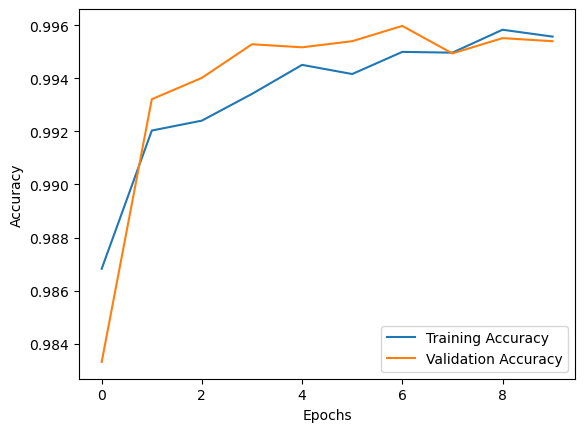

In [28]:
# Plot training and validation accuracy
plt.plot(history_finetune.history['accuracy'], label='Training Accuracy')
plt.plot(history_finetune.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

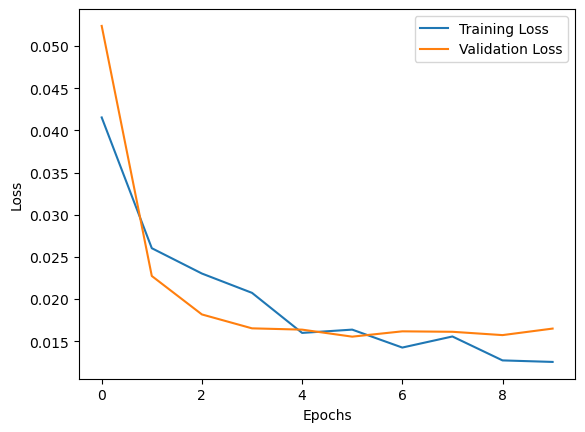

In [29]:
# Plot training and validation loss
plt.plot(history_finetune.history['loss'], label='Training Loss')
plt.plot(history_finetune.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Saving the Fine-tuned Model

In [30]:
# Save the Fine-tuned Model
model.save('fine_tuned_model.h5')

# Load the saved model
loaded_model = load_model('fine_tuned_model.h5')

## Prediction Using the Saved Model

1/1 [==============================] - 0s 27ms/step


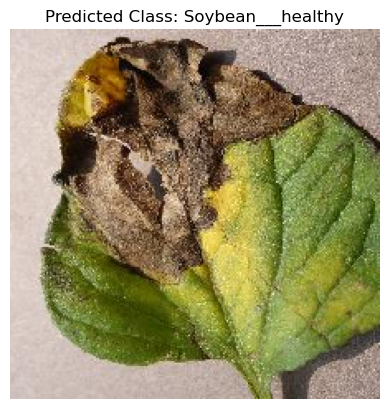

In [32]:
# Use the loaded model for making predictions on new images
new_image_path = '/kaggle/input/plantvillage-dataset/color/Tomato___Late_blight/0a4b3cde-c83a-4c83-b037-010369738152___RS_Late.B 6985.JPG'
new_image = keras_image.load_img(new_image_path, target_size=(224, 224))
new_image_array = keras_image.img_to_array(new_image)
new_image_array = np.expand_dims(new_image_array, axis=0)
new_image_array = new_image_array / 255.0  # Normalize the image

# Get the predicted class probabilities
predicted_probabilities = loaded_model.predict(new_image_array)[0]
predicted_class_index = np.argmax(predicted_probabilities)

# Define the class_labels_dict with class labels and corresponding indices
class_labels_dict = {
    0: 'Apple___Apple_scab',
    1: 'Apple___Black_rot',
    2: 'Apple___Cedar_apple_rust',
    3: 'Apple___healthy',
    4: 'Blueberry___healthy',
    5: 'Cherry_(including_sour)___Powdery_mildew',
    6: 'Cherry_(including_sour)___healthy',
    7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
    8: 'Corn_(maize)___Common_rust_',
    9: 'Corn_(maize)___Northern_Leaf_Blight',
    10: 'Corn_(maize)___healthy',
    11: 'Grape___Black_rot',
    12: 'Grape___Esca_(Black_Measles)',
    13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
    14: 'Grape___healthy',
    15: 'Orange___Haunglongbing_(Citrus_greening)',
    16: 'Peach___Bacterial_spot',
    17: 'Peach___healthy',
    18: 'Pepper,_bell___Bacterial_spot',
    19: 'Pepper,_bell___healthy',
    20: 'Potato___Early_blight',
    21: 'Potato___Late_blight',
    22: 'Potato___healthy',
    23: 'Raspberry___healthy',
    24: 'Soybean___healthy',
    25: 'Squash___Powdery_mildew',
    26: 'Strawberry___Leaf_scorch',
    27: 'Strawberry___healthy',
    28: 'Tomato___Bacterial_spot',
    29: 'Tomato___Early_blight',
    30: 'Tomato___Late_blight',
    31: 'Tomato___Leaf_Mold',
    32: 'Tomato___Septoria_leaf_spot',
    33: 'Tomato___Spider_mites Two-spotted_spider_mite',
    34: 'Tomato___Target_Spot',
    35: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
    36: 'Tomato___Tomato_mosaic_virus',
    37: 'Tomato___healthy'
}

# Check if the predicted_class_index is present in the dictionary
if predicted_class_index in class_labels_dict:
    predicted_class_label = class_labels_dict[predicted_class_index]
else:
    predicted_class_label = 'Unknown Class'

# Display the image and prediction
plt.imshow(new_image)
plt.title(f"Predicted Class: {predicted_class_label}")
plt.axis('off')
plt.show()


## Thank you
- If you liked it, please upvote.
- Made by: Abdelrahman Eldaba